## HDBSCAN

W celu lepszego wyznaczniea przynależności regionów do ofert wykorzystany zostanie algorytm grupujący `HDBSCAN`, którego parametrami wejściowymi będą długość i szerokość geograficzna. Grupowanie bazujące na współrzędnych jest bardziej dokładne niż te opierające się na podziale administracyjnym, gdyż obszar regionu turystycznego nie musi pokrywać się z tym wyznaczonym przez władze miasta. 

### Dobieranie hiperparametrów

Miarą jakości podziału na regiony jest subiektywny "test oka". Oczekiwane cechy podziału to:
- podział nie powinien być zbyt rozdrobniony (brak wyodrębnienia niepotrzebnie małych klastrów).
- podział nie powinien być zbyt jednolity (brak występowania super-regionów)
- aby nie rozmywać wyników, dopuszczalne jest brak przyporządkowania do klastrów dla stosunkowo wielu kwater. 

`HDBSCAN` przyjmuje dwa hiperparametry:
- `min_samples` - ile innych punktów musi być wystarczająco blisko danego obiektu, aby mógł on dołączyć do klastra.
- `min_cluster_size` - ile punktów musi wchodzić w skład klastra, aby został on wyodrębniony.

In [1]:
%load_ext autoreload
%autoreload 2

import sys
from pathlib import Path

sys.path.append(str(Path("..").resolve()))

### *min_samples*

Specyfiką tego hiperparametru jest fakt, iż wraz z jego zmniejszaniem zasady przyjmowania punktów do klastra stają się coraz mniej restrykcyjne. Finalnie została przyjęta wartość `min_samples` = **1**. Mimo najmniejszej możliwej wartości, przykłady z następnego punktu mogą skłaniać do dalszego rozszerzania granic klastrów na kilka sąsiednich punktów, co nie jest możliwe do osiągnięcia za pomocą *min_samples* z powodu braku zakresu.

### *min_cluster_size*

Sprawdzone zostaną wartości całkowite z zakresu <10, 25>. 

Dla min_cluster_size=10 znaleziono 40 klastrów
Dla min_cluster_size=11 znaleziono 37 klastrów
Dla min_cluster_size=12 znaleziono 29 klastrów
Dla min_cluster_size=13 znaleziono 27 klastrów
Dla min_cluster_size=14 znaleziono 23 klastrów
Dla min_cluster_size=15 znaleziono 22 klastrów
Dla min_cluster_size=16 znaleziono 21 klastrów
Dla min_cluster_size=17 znaleziono 18 klastrów
Dla min_cluster_size=18 znaleziono 18 klastrów
Dla min_cluster_size=19 znaleziono 17 klastrów
Dla min_cluster_size=20 znaleziono 17 klastrów
Dla min_cluster_size=21 znaleziono 16 klastrów
Dla min_cluster_size=22 znaleziono 13 klastrów
Dla min_cluster_size=23 znaleziono 11 klastrów
Dla min_cluster_size=24 znaleziono 10 klastrów
Dla min_cluster_size=25 znaleziono 10 klastrów


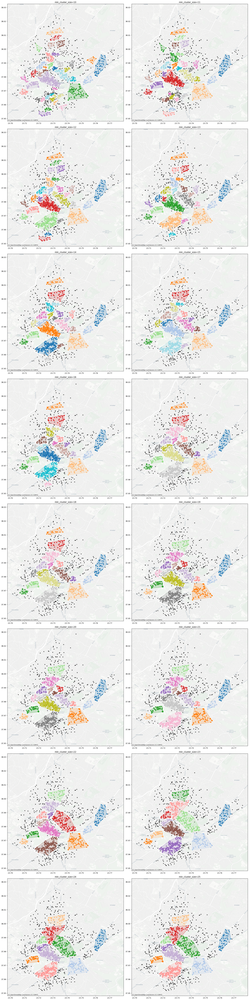

In [ ]:
from src.dbscan import *
import pandas as pd

listings = pd.read_csv("../data/raw/listings.csv", usecols=["id", "latitude", "longitude"])
min_cluster_sizes = [i for i in range(10, 26)]

evaluations = aggregate_results(listings, min_cluster_sizes)
visualize_regions_grid(evaluations, ncols=2, figsize_per_plot=(10,10))

Finalnie wybrana wartość to `min_cluster_size` = **14**. Jest to wartość, dla której zaniknęło zjawisko nadmiernego rozdrobnienia, oraz liczba wykrytych klastrów jest największa (równa **23**).